#Installing dependencies

In [1]:
#!sudo apt install tesseract-ocr -q
#!pip install pytesseract -q
#!pip install easyocr -q
!pip install keras-ocr -q
#!pip install imgaug -q
#!pip install ipyplot -q
#!pip install --upgrade opencv-contrib-python
!pip install opencv-contrib-python==4.3.0.36

     |████████████████████████████████| 42 kB 683 kB/s 
     |████████████████████████████████| 965 kB 9.7 MB/s 
     |████████████████████████████████| 9.5 MB 43.2 MB/s 
     |████████████████████████████████| 604 kB 38.1 MB/s 
     |████████████████████████████████| 50 kB 6.4 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 49.9 MB 226 kB/s 
Reason for being yanked: Release deprecated
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.6.0.66
    Uninstalling opencv-contrib-python-4.6.0.66:
      Successfully uninstalled opencv-contrib-python-4.6.0.66


In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
img_file = 'download.png'
full_img = cv2.imread(img_file)

In [49]:
#https://stackoverflow.com/questions/28816046/
#displaying-different-images-with-actual-size-in-matplotlib-subplot
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

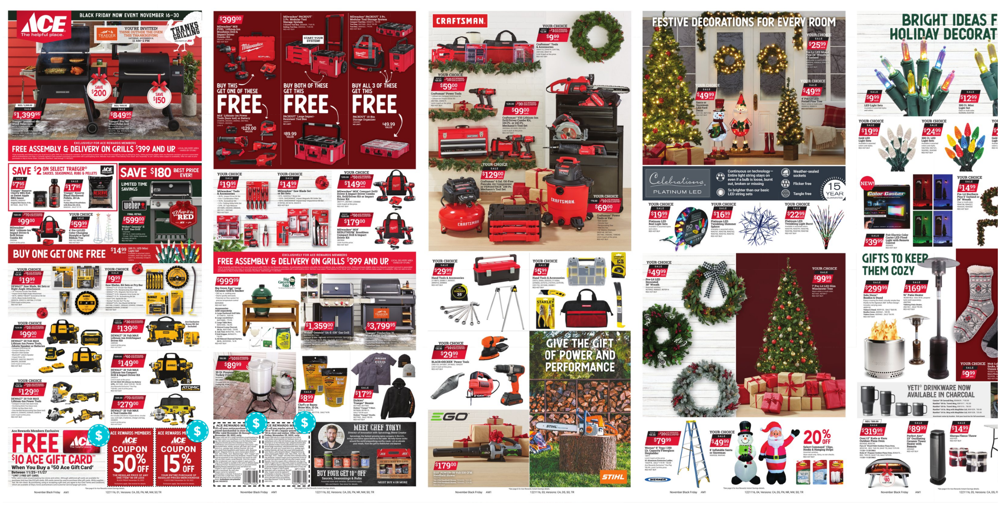

In [12]:
display(img_file)

#Preprocessing the images



##Deviding into seprate sub-images

In [3]:
image_file = 'download.png'
image = cv2.imread(image_file)

In [4]:
height, width = image.shape[:2]
# Let's get the starting pixel coordiantes (top left of cropped top)
start_row, start_col = int(0), int(0)
# Let's get the ending pixel coordinates (bottom right of cropped top)
end_row, end_col = int(height * .5), int(width)
cropped_top = image[start_row:end_row , start_col:end_col]

# Let's get the starting pixel coordiantes (top left of cropped bottom)
start_row, start_col = int(height * .5), int(0)
# Let's get the ending pixel coordinates (bottom right of cropped bottom)
end_row, end_col = int(height), int(width)
cropped_bot = image[start_row:end_row , start_col:end_col]

#cv2.imwrite("image_top.png", cropped_top)
#cv2.imwrite("image_bottom.png", cropped_bot)

In [5]:
#cropping the 1st and 6th image
height, width = cropped_top.shape[:2]
start_row, start_col = int(0), int(0)
end_row, end_col = int(height), int(630)
image1 = cropped_top[start_row:end_row , start_col:end_col]
#cv2.imwrite("image1.png", image1)
image6 = cropped_bot[start_row:end_row , start_col:end_col]
#cv2.imwrite("image6.png", image6)

#cropping the 2nd and 7th image
start_row, start_col = int(0), int(640)
end_row, end_col = int(height), int(1280)
image2 = cropped_top[start_row:end_row , start_col:end_col]
#cv2.imwrite("image2.png", image2)
image7 = cropped_bot[start_row:end_row , start_col:end_col]
#cv2.imwrite("image7.png", image7)

#cropping the 3rd and 8th image
start_row, start_col = int(0), int(1290)
end_row, end_col = int(height), int(1940)
image3 = cropped_top[start_row:end_row , start_col:end_col]
#cv2.imwrite("image3.png", image3)
image8 = cropped_bot[start_row:end_row , start_col:end_col]
#cv2.imwrite("image8.png", image8)

#cropping the 4th and 9th image
start_row, start_col = int(0), int(1950)
end_row, end_col = int(height), int(2600)
image4 = cropped_top[start_row:end_row , start_col:end_col]
#cv2.imwrite("image4.png", image4)
image9 = cropped_bot[start_row:end_row , start_col:end_col]
#cv2.imwrite("image9.png", image9)

#cropping the 5th and 10th image
start_row, start_col = int(0), int(2610)
end_row, end_col = int(height), int(width)
image5 = cropped_top[start_row:end_row , start_col:end_col]
#cv2.imwrite("image5.png", image5)
image10 = cropped_bot[start_row:end_row , start_col:end_col]
#cv2.imwrite("image10.png", image10)

##Image Augmentation for YOLOv5 training

In [ ]:
import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import ipyplot

In [8]:
input_img = imageio.imread('3.png')

In [9]:
#Horizontal Flip
hflip= iaa.Fliplr(p=1.0)
input_hf= hflip.augment_image(input_img)
imageio.imwrite('6.png',input_hf)


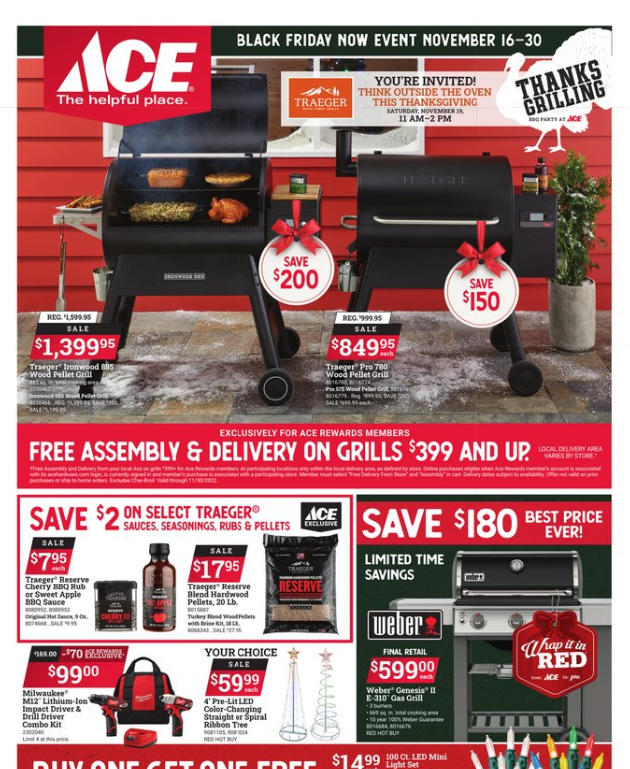
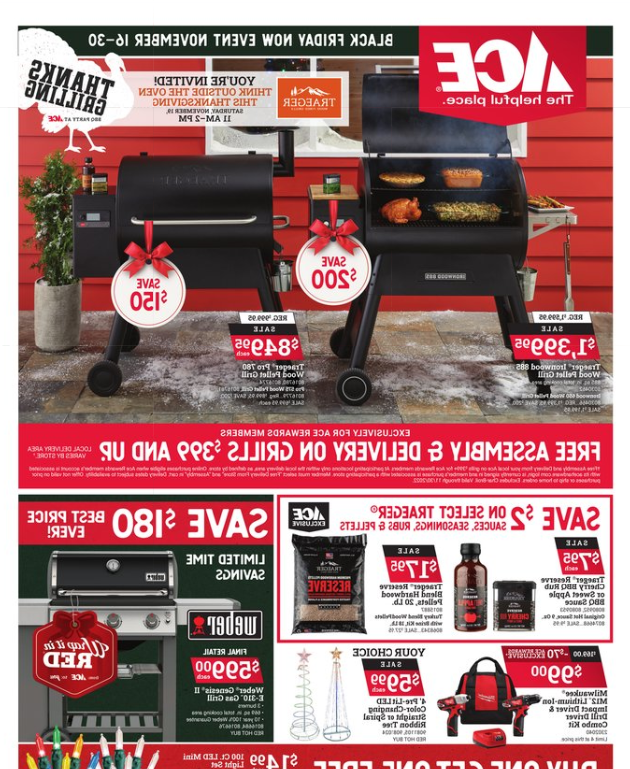


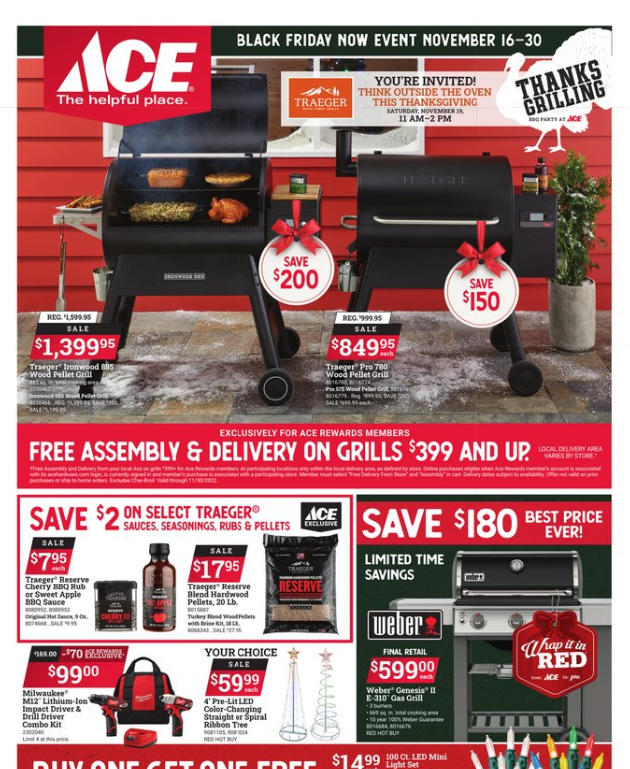
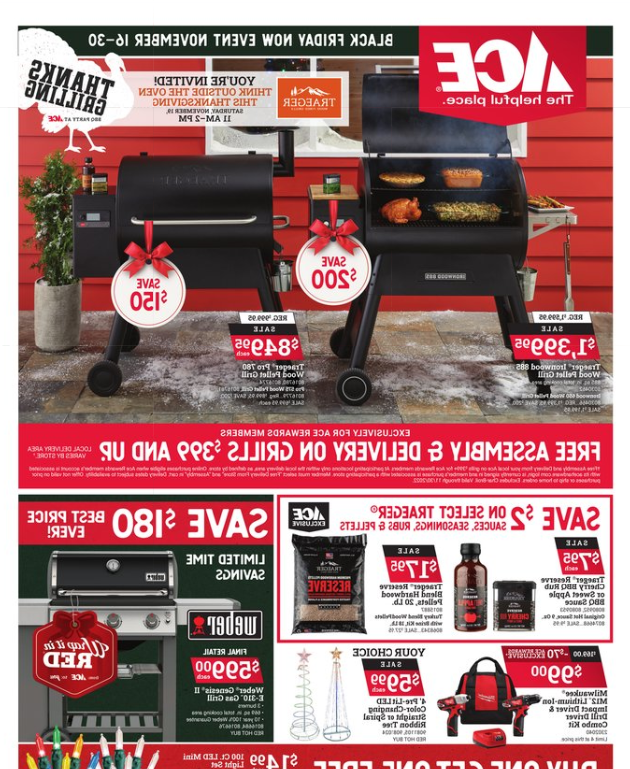

In [11]:
images_list=[input_img, input_hf]
labels = ['Original', 'Horizontally flipped']
ipyplot.plot_images(images_list,labels=labels,img_width=180)

In [14]:
input_img = imageio.imread('3.png')

In [15]:
noise=iaa.AdditiveGaussianNoise(10,40)
input_noise=noise.augment_image(input_img)
imageio.imwrite('9.png',input_noise)


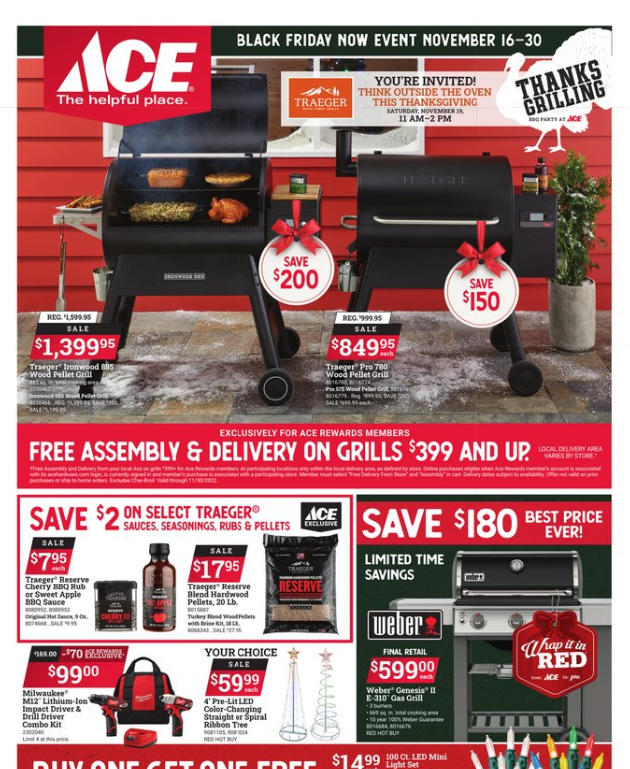
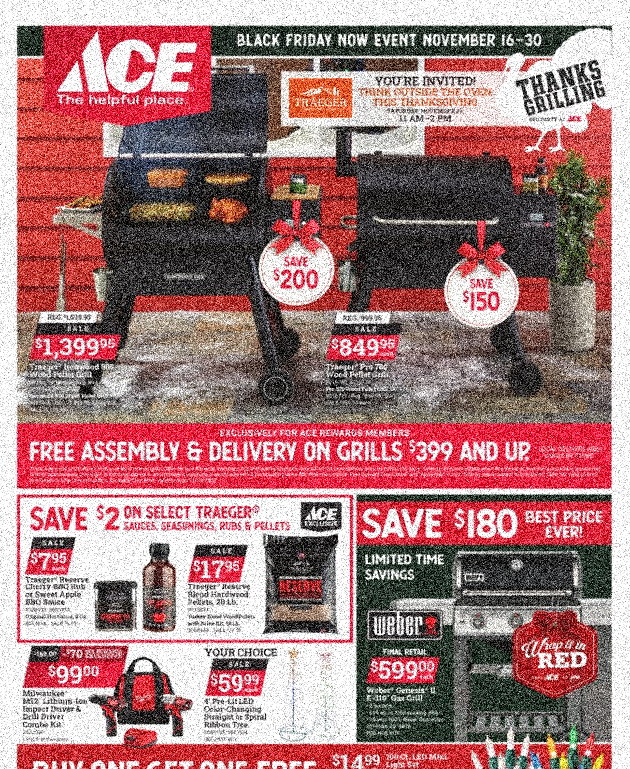


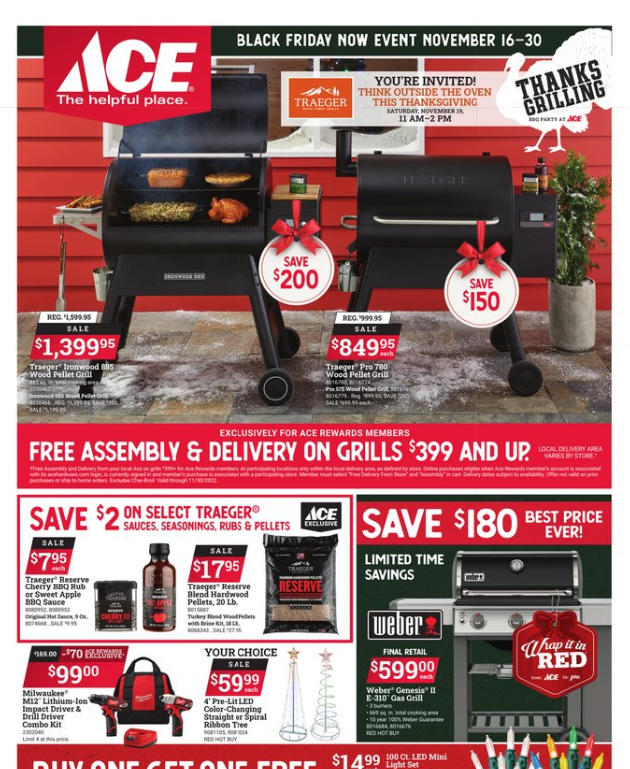
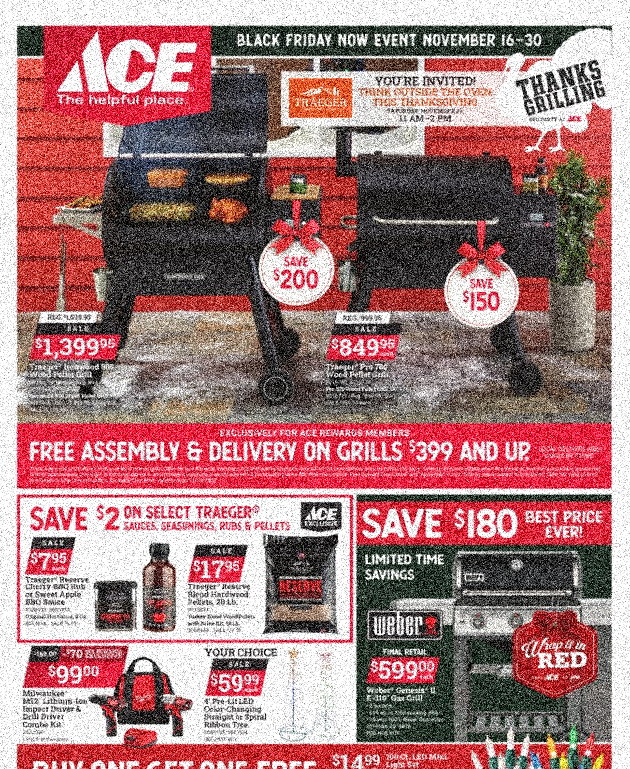

In [26]:
images_list=[input_img, input_noise]
labels = ['Original', 'Gaussian Noise Image']
ipyplot.plot_images(images_list,labels=labels,img_width=180)

##Importing YOLOv5 results

In [1]:
import cv2
import numpy as np
import pandas as pd

In [2]:
#Cropping the bounding boxes from the images
df = pd.read_csv('10.csv')
img = cv2.imread("image10.png")
for idx in df.index:
    xmin = int(df['xmin'][idx])-6
    xmax = int(df['xmax'][idx])+15
    ymin = int(df['ymin'][idx])-6
    ymax = int(df['ymax'][idx])+15
    bbox = img[ymin:ymax, xmin:xmax]
    cv2.imwrite('{0}.png'.format(idx+50), bbox)

##Experiment with traditional CV

In [115]:
img_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY) 
template = cv2.imread('template.png', cv2.IMREAD_GRAYSCALE)
w, h = template.shape
res = cv2.matchTemplate(img_gray, template, cv2.TM_CCOEFF_NORMED)
_, _, _, maxLoc=cv2.minMaxLoc(res)
cv2.rectangle(image1, maxLoc, (maxLoc[0]+h, maxLoc[1]+w), (0, 255, 255), 2)
cv2.imwrite('Detected.png', image1)
crop_img = image1[maxLoc[1]:maxLoc[1]+w, maxLoc[0]:maxLoc[0]+h, :]
cv2.imwrite("cropped.png", crop_img)

True

In [ ]:
img_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY) 
template = cv2.imread('template.png', cv2.IMREAD_GRAYSCALE)
# Initiate SIFT detector
sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(template,None)
kp2, des2 = sift.detectAndCompute(img_gray,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)  

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(des1,des2,k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# ratio test
for i,(match1,match2) in enumerate(matches):
    if match1.distance < 0.5*match2.distance:
        matchesMask[i]=[1,0]

draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = 0)

flann_matches = cv2.drawMatchesKnn(template,kp1,img_gray,kp2,matches,None,**draw_params)
cv2.imwrite("flann_matches.png", flann_matches)

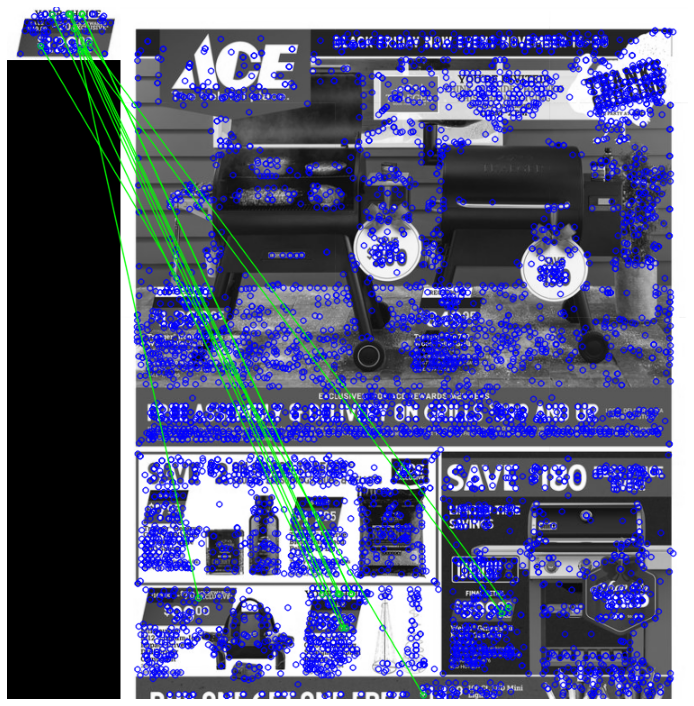

In [19]:
display('flann_matches.png')

In [67]:
color = [255, 255, 255]
top, bottom, left, right = [150]*4
image = cv2.copyMakeBorder(image, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
#cv2.imwrite("image_with_border.jpg", image)

In [72]:
gray = cv2.cvtColor(cropped_top, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Create rectangular structuring element and dilate
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,25))
dilate = cv2.dilate(thresh, kernel, iterations=1)

In [73]:
cv2.imwrite("sample_dilated.png", dilate)

True

In [74]:
# Find contours and draw rectangle
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[1])

In [77]:
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    if h > 300 and w > 250:
      cv2.rectangle(cropped_top, (0, y), (x, 0 + h+20), (36,255,12), 2)

In [78]:
cv2.imwrite("sample_boxes.png", cropped_top)

True

##Upscaling and sharpening images

In [6]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from cv2 import dnn_superres
from tqdm import tqdm

In [4]:
sr = dnn_superres.DnnSuperResImpl_create()
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
path = "EDSR_x3.pb"

In [7]:
for i in tqdm(range(54)):
  img = cv2.imread("{0}.png".format(i+1))
  sr.readModel(path)
  # Set the desired model and scale to get correct pre- and post-processing
  sr.setModel("edsr", 3)
  # Upscale the image
  result = sr.upsample(img)
  img_sharp = cv2.filter2D(src=result, ddepth=-1, kernel=kernel)
  cv2.imwrite(r'upscaled/{0}.png'.format(i+1), img_sharp)

100%|██████████| 54/54 [15:22<00:00, 17.08s/it]


In [ ]:
!zip -r /content/upscaled.zip /content/upscaled

#Experiment with different pre-trained OCR models

In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import re

In [19]:
img = cv2.imread("1us.png")

##pytesseract

In [39]:
import pytesseract
tesseract_result = pytesseract.image_to_string(image5, lang='eng')

In [40]:
print(tesseract_result)

BRIGHT IDEAS F
HOLIDAY DECORAT

 



##easy-ocr

In [15]:
import easyocr

reader = easyocr.Reader(['en'], gpu = False)

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [16]:
easy_results = reader.readtext(img)

In [17]:
easyDF = pd.DataFrame(easy_results, columns=['bbox','text','conf'])
easyDF.sample(5)

,bbox,text,conf
3,"[[16, 68], [44, 68], [44, 74], [16, 74]]",onan,0.080878
0,"[[46, 20], [68, 20], [68, 26], [46, 26]]",Se,0.001379
1,"[[18, 28], [94, 28], [94, 60], [18, 60]]",s29999,0.985885
4,"[[52, 66], [76, 66], [76, 74], [52, 74]]",Sund,0.716750
2,"[[16, 58], [48, 58], [48, 66], [16, 66]]",Salo Sia,0.412497


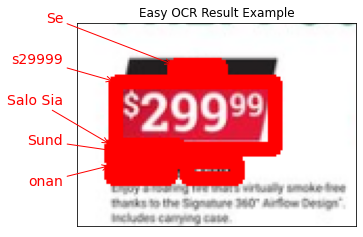

In [18]:
fig, ax = plt.subplots(figsize=(5, 5))
easy_results = easyDF[['text','bbox']].values.tolist()
new_easy_results = [(x[0], np.array(x[1])) for x in easy_results]
keras_ocr.tools.drawAnnotations(plt.imread('51.png'), new_easy_results, ax=ax)
ax.set_title('Easy OCR Result Example')
plt.show()

##keras-ocr

In [12]:
import keras_ocr

pipeline = keras_ocr.pipeline.Pipeline(max_size=4096)

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [20]:
keras_results = pipeline.recognize([img])

1/1 [==============================] - 3s 3s/step


In [24]:
df = pd.DataFrame(keras_results[0], columns=['text', 'bbox'])
df

,text,bbox
0,70,"[[137.62476, 30.255672], [203.89691, 33.268032..."
1,eess,"[[203.0, 32.0], [324.0, 32.0], [324.0, 63.0], ..."
2,do,"[[96.0, 37.0], [125.0, 37.0], [125.0, 59.0], [..."
3,gua,"[[52.0, 38.0], [96.0, 38.0], [96.0, 58.0], [52..."
4,s9g00,"[[94.35921, 78.6517], [253.47536, 81.09964], [..."
5,mil,"[[19.0, 156.0], [61.0, 156.0], [61.0, 179.0], ..."
6,waukcs,"[[55.664696, 158.25204], [146.82996, 156.0285]..."
7,lithiumlon,"[[78.0, 178.0], [217.0, 178.0], [217.0, 201.0]..."
8,miz,"[[19.0, 179.0], [70.0, 179.0], [70.0, 201.0], ..."
9,dniver,"[[103.0, 203.0], [177.0, 203.0], [177.0, 225.0..."


In [29]:
for i in tqdm(range(54)):
  img = cv2.imread(r"upscaled/{0}.png".format(i+1))
  keras_results = pipeline.recognize([img])
  df = pd.DataFrame(keras_results[0], columns=['text', 'bbox'])
  df.to_csv(r'upscaled_results/{0}.csv'.format(i+1), index=False)

  0%|          | 0/54 [00:00<?, ?it/s]

1/1 [==============================] - 3s 3s/step


  2%|▏         | 1/54 [00:13<12:01, 13.61s/it]

1/1 [==============================] - 3s 3s/step


  4%|▎         | 2/54 [00:27<11:57, 13.80s/it]

1/1 [==============================] - 5s 5s/step


  6%|▌         | 3/54 [00:43<12:24, 14.59s/it]

1/1 [==============================] - 2s 2s/step


  7%|▋         | 4/54 [00:55<11:27, 13.75s/it]

1/1 [==============================] - 3s 3s/step


  9%|▉         | 5/54 [01:05<10:13, 12.53s/it]

1/1 [==============================] - 3s 3s/step


 11%|█         | 6/54 [01:16<09:26, 11.81s/it]

1/1 [==============================] - 6s 6s/step


 13%|█▎        | 7/54 [01:27<09:07, 11.64s/it]

1/1 [==============================] - 5s 5s/step


 15%|█▍        | 8/54 [01:42<09:47, 12.78s/it]

1/1 [==============================] - 4s 4s/step


 17%|█▋        | 9/54 [01:56<09:53, 13.18s/it]

1/1 [==============================] - 4s 4s/step


 19%|█▊        | 10/54 [02:10<09:50, 13.41s/it]

1/1 [==============================] - 3s 3s/step


 20%|██        | 11/54 [02:24<09:37, 13.43s/it]

1/1 [==============================] - 3s 3s/step


 22%|██▏       | 12/54 [02:33<08:29, 12.13s/it]

1/1 [==============================] - 3s 3s/step


 24%|██▍       | 13/54 [02:43<07:50, 11.47s/it]

1/1 [==============================] - 7s 7s/step


 26%|██▌       | 14/54 [02:56<07:59, 11.98s/it]

1/1 [==============================] - 3s 3s/step


 28%|██▊       | 15/54 [03:12<08:28, 13.04s/it]

1/1 [==============================] - 4s 4s/step


 30%|██▉       | 16/54 [03:23<07:52, 12.44s/it]

1/1 [==============================] - 4s 4s/step


 31%|███▏      | 17/54 [03:37<07:56, 12.88s/it]

1/1 [==============================] - 2s 2s/step


 33%|███▎      | 18/54 [03:43<06:39, 11.10s/it]

1/1 [==============================] - 3s 3s/step


 35%|███▌      | 19/54 [03:56<06:47, 11.64s/it]

1/1 [==============================] - 3s 3s/step


 37%|███▋      | 20/54 [04:04<05:58, 10.55s/it]

1/1 [==============================] - 4s 4s/step


 39%|███▉      | 21/54 [04:20<06:37, 12.05s/it]

1/1 [==============================] - 3s 3s/step


 41%|████      | 22/54 [04:30<06:09, 11.54s/it]

1/1 [==============================] - 2s 2s/step


 43%|████▎     | 23/54 [04:37<05:15, 10.17s/it]

1/1 [==============================] - 1s 1s/step


 44%|████▍     | 24/54 [04:42<04:17,  8.59s/it]

1/1 [==============================] - 3s 3s/step


 46%|████▋     | 25/54 [04:56<04:50, 10.02s/it]

1/1 [==============================] - 3s 3s/step


 48%|████▊     | 26/54 [05:04<04:27,  9.56s/it]

1/1 [==============================] - 3s 3s/step


 50%|█████     | 27/54 [05:12<04:02,  8.99s/it]

1/1 [==============================] - 3s 3s/step


 52%|█████▏    | 28/54 [05:21<03:55,  9.05s/it]

1/1 [==============================] - 3s 3s/step


 54%|█████▎    | 29/54 [05:35<04:22, 10.49s/it]

1/1 [==============================] - 3s 3s/step


 56%|█████▌    | 30/54 [05:47<04:23, 10.96s/it]

1/1 [==============================] - 6s 6s/step


 57%|█████▋    | 31/54 [06:03<04:48, 12.54s/it]

1/1 [==============================] - 3s 3s/step


 59%|█████▉    | 32/54 [06:19<04:55, 13.43s/it]

1/1 [==============================] - 5s 5s/step


 61%|██████    | 33/54 [06:34<04:53, 13.98s/it]

1/1 [==============================] - 5s 5s/step


 63%|██████▎   | 34/54 [06:49<04:45, 14.28s/it]

1/1 [==============================] - 5s 5s/step


 65%|██████▍   | 35/54 [07:01<04:18, 13.62s/it]

1/1 [==============================] - 4s 4s/step


 67%|██████▋   | 36/54 [07:13<03:58, 13.24s/it]

1/1 [==============================] - 2s 2s/step


 69%|██████▊   | 37/54 [07:20<03:12, 11.33s/it]

1/1 [==============================] - 3s 3s/step


 70%|███████   | 38/54 [07:30<02:56, 11.04s/it]

1/1 [==============================] - 3s 3s/step


 72%|███████▏  | 39/54 [07:44<02:58, 11.88s/it]

1/1 [==============================] - 3s 3s/step


 74%|███████▍  | 40/54 [07:51<02:23, 10.26s/it]

1/1 [==============================] - 1s 1s/step


 76%|███████▌  | 41/54 [07:59<02:03,  9.53s/it]

1/1 [==============================] - 5s 5s/step


 78%|███████▊  | 42/54 [08:19<02:34, 12.87s/it]

1/1 [==============================] - 3s 3s/step


 80%|███████▉  | 43/54 [08:28<02:06, 11.52s/it]

1/1 [==============================] - 3s 3s/step


 81%|████████▏ | 44/54 [08:43<02:07, 12.71s/it]

1/1 [==============================] - 3s 3s/step


 83%|████████▎ | 45/54 [08:57<01:56, 12.92s/it]

1/1 [==============================] - 2s 2s/step


 85%|████████▌ | 46/54 [09:03<01:28, 11.11s/it]

1/1 [==============================] - 3s 3s/step


 87%|████████▋ | 47/54 [09:17<01:22, 11.82s/it]

1/1 [==============================] - 4s 4s/step


 89%|████████▉ | 48/54 [09:28<01:10, 11.68s/it]

1/1 [==============================] - 4s 4s/step


 91%|█████████ | 49/54 [09:37<00:53, 10.67s/it]

1/1 [==============================] - 3s 3s/step


 93%|█████████▎| 50/54 [09:50<00:45, 11.43s/it]

1/1 [==============================] - 5s 5s/step


 94%|█████████▍| 51/54 [10:05<00:37, 12.67s/it]

1/1 [==============================] - 2s 2s/step


 96%|█████████▋| 52/54 [10:13<00:22, 11.16s/it]

1/1 [==============================] - 7s 7s/step


 98%|█████████▊| 53/54 [10:30<00:12, 12.92s/it]

1/1 [==============================] - 2s 2s/step


100%|██████████| 54/54 [10:37<00:00, 11.80s/it]


In [ ]:
!zip -r /content/upscaled_results.zip /content/upscaled_results

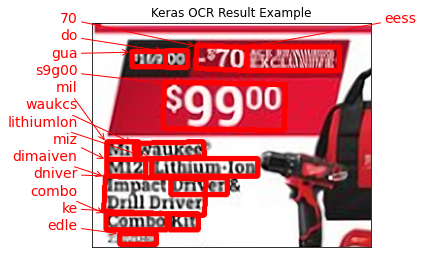

In [22]:
fig, ax = plt.subplots(figsize=(5, 5))
keras_ocr.tools.drawAnnotations(plt.imread('1us.png'), keras_results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

##comparision between results

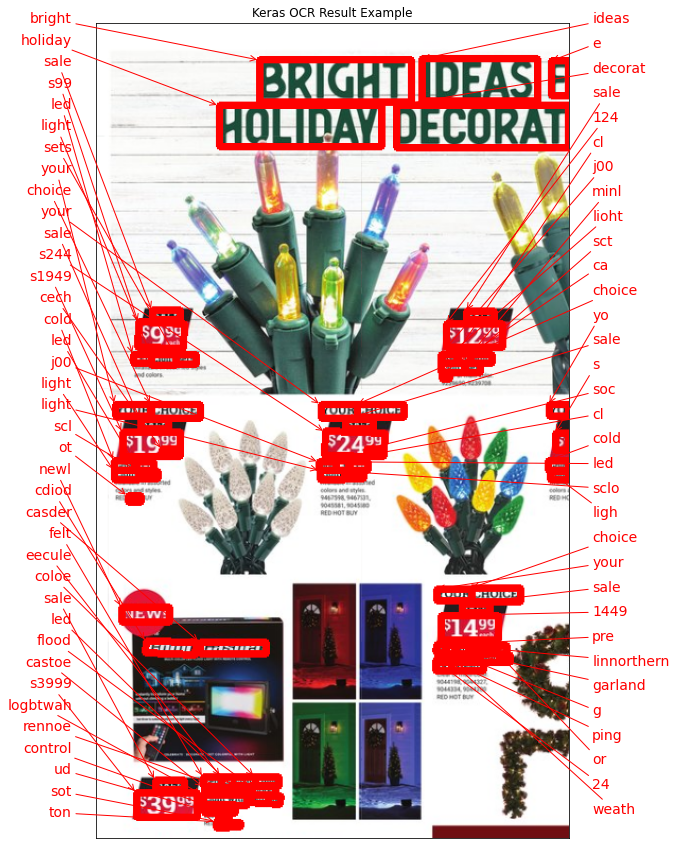

In [20]:
fig, ax = plt.subplots(figsize=(15, 15))
keras_ocr.tools.drawAnnotations(plt.imread('image5.png'), keras_results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

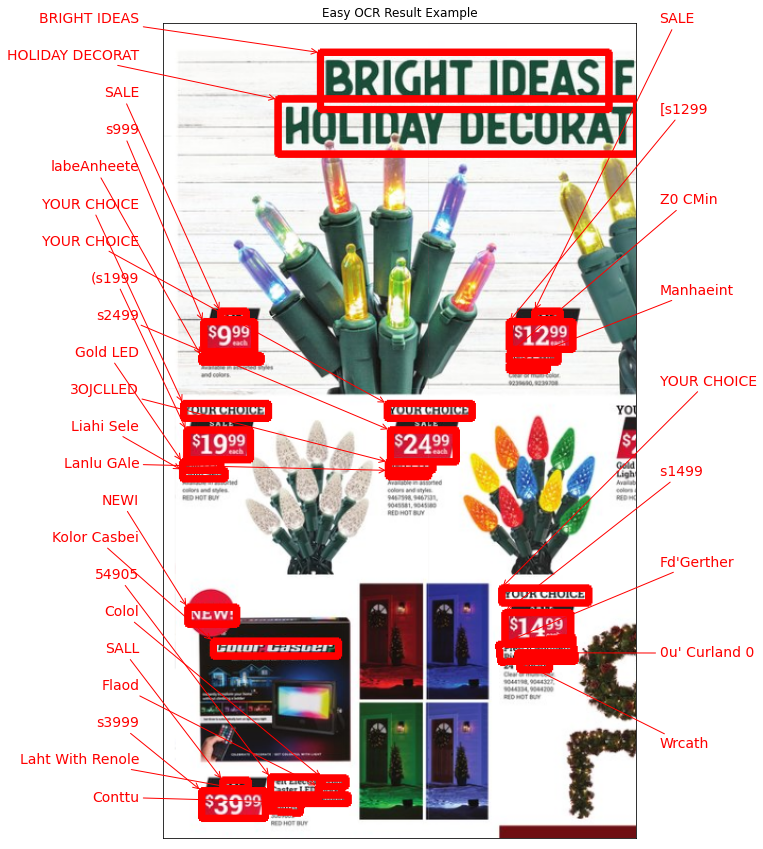

In [37]:
fig, ax = plt.subplots(figsize=(15, 15))
easy_results = easyDF[['text','bbox']].values.tolist()
new_easy_results = [(x[0], np.array(x[1])) for x in easy_results]
keras_ocr.tools.drawAnnotations(plt.imread('image5.png'), new_easy_results, ax=ax)
ax.set_title('Easy OCR Result Example')
plt.show()

##modifying keras-ocr outputs

In [ ]:
#!unzip offers_results.zip 
!unzip upscaled_offers_results.zip 

In [24]:
#or_df = pd.read_csv('offers_results/33.csv')
uor_df = pd.read_csv('upscaled_offers_results/33.csv')
uor_df.dropna(inplace=True)
uor_df

,text,bbox
0,choice,[[198. 35.]\n [322. 35.]\n [322. 64.]\n [19...
1,your,[[ 98.00001 35.999992]\n [192. 35.999...
2,20,[[179. 75.]\n [221. 75.]\n [221. 106.]\n [17...
3,ou,[[224. 76.]\n [316. 76.]\n [316. 105.]\n [22...
4,ddo,[[ 71. 81.]\n [139. 81.]\n [139. 101.]\n [ 7...
5,sggo0,[[115.34357 120.66684 ]\n [274.49054 123.115...
6,volt,[[185. 203.]\n [233. 203.]\n [233. 226.]\n [18...
7,max,[[236. 203.]\n [298. 203.]\n [298. 226.]\n [23...
8,devialt,[[ 37. 204.]\n [138. 204.]\n [138. 225.]\n [ 3...
9,20,[[151. 204.]\n [181. 204.]\n [181. 225.]\n [15...


In [25]:
result = uor_df['text'].tolist()
text = ' '.join(result)
print(text)

choice your 20 ou ddo sggo0 volt max devialt 20 lithiumion power tools jobsite spoaker batteries oy co ota eli col


In [26]:
text = text.replace('g', '9').replace('o', '0')
print(text)

ch0ice y0ur 20 0u dd0 s9900 v0lt max devialt 20 lithiumi0n p0wer t00ls j0bsite sp0aker batteries 0y c0 0ta eli c0l


In [35]:
x = re.findall("\d{3,5}", text)
y = sorted([int(e) for e in x], reverse=True)
print(int(y[0])/100)

99.0


In [36]:
pricedf = pd.DataFrame(columns=['Price'])
for i in tqdm(range(54)):
  df = pd.read_csv('upscaled_offers_results/{0}.csv'.format(i+1))
  df.dropna(inplace=True)
  text = (' '.join(df['text'].tolist())).replace('g', '9').replace('o', '0')
  x = re.findall("\d{3,5}", text)
  y = sorted([int(e) for e in x], reverse=True)
  p = int(y[0])/100
  pricedf = pricedf.append({'Price': p}, ignore_index=True)

100%|██████████| 54/54 [00:00<00:00, 103.18it/s]


In [38]:
pricedf.to_csv('prices.csv', index=False)

In [2]:
uor_df = pd.read_csv('upscaled_offers_results/1.csv')
uor_df.dropna(inplace=True)
uor_df

,text,bbox
0,70,[[137.62476 30.255672]\n [203.89691 33.268...
1,eess,[[203. 32.]\n [324. 32.]\n [324. 63.]\n [20...
2,do,[[ 96. 37.]\n [125. 37.]\n [125. 59.]\n [ 9...
3,gua,[[52. 38.]\n [96. 38.]\n [96. 58.]\n [52. 58.]]
4,s9g00,[[ 94.35921 78.6517 ]\n [253.47536 81.09964]...
5,mil,[[ 19. 156.]\n [ 61. 156.]\n [ 61. 179.]\n [ 1...
6,waukcs,[[ 55.664696 158.25204 ]\n [146.82996 156.028...
7,lithiumlon,[[ 78. 178.]\n [217. 178.]\n [217. 201.]\n [ 7...
8,miz,[[ 19. 179.]\n [ 70. 179.]\n [ 70. 201.]\n [ 1...
9,dniver,[[103. 203.]\n [177. 203.]\n [177. 225.]\n [10...


In [3]:
result = uor_df['text'].tolist()
txt = ' '.join(result)
print(txt)

70 eess do gua s9g00 mil waukcs lithiumlon miz dniver dimaiven combo ke edle


In [4]:
txt = txt.replace('g', '9').replace('o', '0')
print(txt)

70 eess d0 9ua s9900 mil waukcs lithiuml0n miz dniver dimaiven c0mb0 ke edle


In [5]:
x = re.findall("\d{3,5}", txt)
y = sorted([int(e) for e in x], reverse=True)
item = txt.split('{0}'.format(y[0]))
txt_lst = item[1].split()
print(len(txt_lst))

9


In [6]:
result1 = uor_df['text'][-9:].tolist()
print(result1)

['mil', 'waukcs', 'lithiumlon', 'miz', 'dniver', 'dimaiven', 'combo', 'ke', 'edle']


In [7]:
itemdf = pd.DataFrame(columns=['Item'])
for i in tqdm(range(54)):
  df = pd.read_csv('upscaled_offers_results/{0}.csv'.format(i+1))
  df.dropna(inplace=True)
  txt = (' '.join(df['text'].tolist())).replace('g', '9').replace('o', '0')
  x = re.findall("\d{3,5}", txt)
  y = sorted([int(e) for e in x], reverse=True)
  txt_lst = txt.split('{0}'.format(y[0]))[1].split()
  length = len(txt_lst)
  item = ' '.join(df['text'][-length:].tolist())
  itemdf = itemdf.append({'Item': item}, ignore_index=True)

100%|██████████| 54/54 [00:00<00:00, 200.23it/s]


In [8]:
itemdf.to_csv('items.csv', index=False)

In [9]:
itemsdf = pd.read_csv('items.csv')
pricedf = pd.read_csv('prices.csv')

In [12]:
result = itemsdf.join(pricedf)

In [14]:
result

,Item,Price
0,mil waukcs lithiumlon miz dniver dimaiven comb...,99.00
1,ecl aptelitled color changing splial slralght ...,59.99
2,cos weber genesis d grill ejno gas slunes udns...,599.00
3,805 ironvcod wodp pellec gil,139.96
4,caah resere taceex cnoily beorub swect apple o...,7.95
5,bende resve hardwrood pellets 20 lb dilie eee ...,17.65
6,coth prio 760 woop pelet gil coona csd contol ...,84.95
7,milamed mis connact dilv c diver combo dnver i...,149.00
8,milwaukec mie redlithium brushless dill compac...,179.00
9,cach mawaakee blada set sa blsets ox vudus ar ...,14.99


In [17]:
result.to_csv('output.csv', index=False)